### Word2vec
- 100 ~ 200 차원이 잘되더라(경험적인 부분)

## GAN

In [11]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt


step : 0, real : 0.5812696814537048, fake : 0.5086232423782349


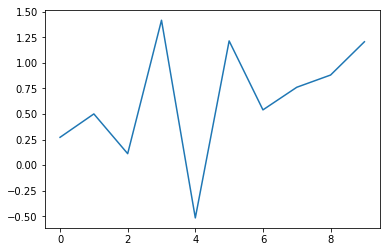

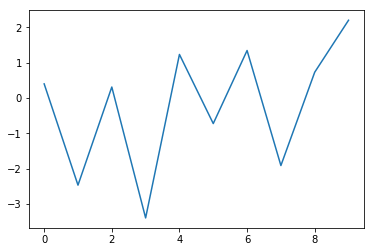

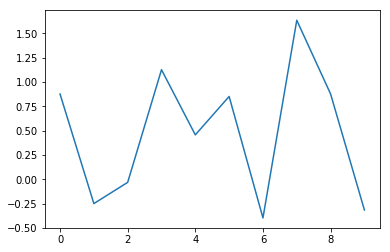

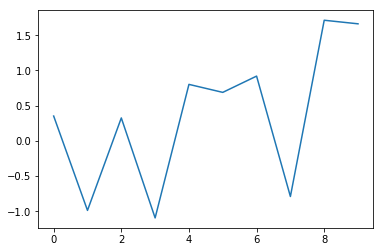

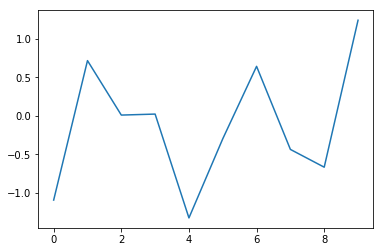

...

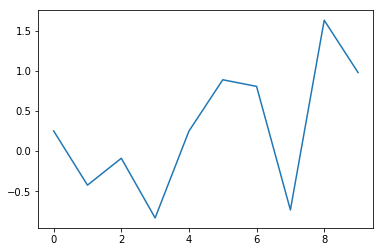

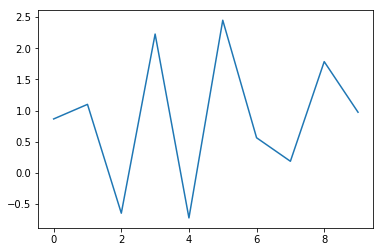

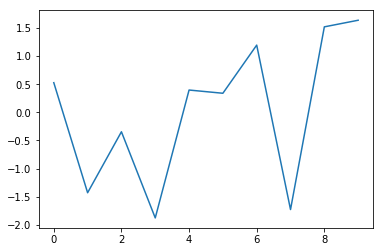

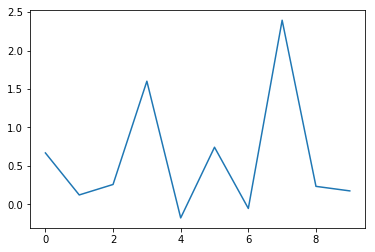

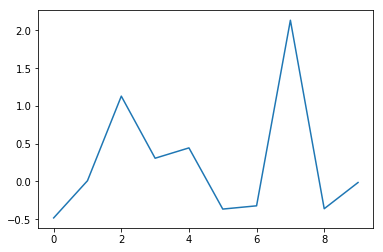

In [14]:
tf.reset_default_graph()

data = [[i for i in range(10)] for _ in range(1000)]
noise = np.random.randn(1000, 10)

real_data = tf.placeholder(tf.float32, shape=[None, 10])
z = tf.placeholder(tf.float32, shape=[None, 10])

def generator(z):
    name = 'generator/layer_{}'
    layer1 = tf.layers.dense(z, 10, name=name.format(1))
    layer2 = tf.layers.dense(layer1, 10, name=name.format(2))
    layer3 = tf.layers.dense(layer2, 10, name=name.format(3))
    out = tf.layers.dense(layer3, 10, name=name.format('out'))
    return out

def discriminator(feature, reuse):
    name = 'discriminator/layer_{}'
    layer1 = tf.layers.dense(feature, 15, reuse=reuse, name=name.format(1))
    layer2 = tf.layers.dense(layer1, 15, reuse=reuse, name=name.format(2))
    layer3 = tf.layers.dense(layer2, 15, reuse=reuse, name=name.format(3))
    layer4 = tf.layers.dense(layer3, 15, reuse=reuse, name=name.format(4))
    out = tf.layers.dense(layer4, 1, reuse=reuse, name=name.format('out'))
    return out

def gan_loss(real_logits, fake_logits):
    real_loss = tf.losses.sigmoid_cross_entropy(tf.ones_like(real_logits), real_logits)
    fake_loss = tf.losses.sigmoid_cross_entropy(tf.zeros_like(fake_logits), fake_logits)
    disc_loss = real_loss + fake_loss
    
    gen_loss = tf.losses.sigmoid_cross_entropy(tf.ones_like(fake_logits), fake_logits)
    return disc_loss, gen_loss

def train(loss, variables):
    optim = tf.train.GradientDescentOptimizer(1e-2)
    grad = optim.compute_gradients(loss, var_list=variables)
    return optim.apply_gradients(grad)
 
    
fake_data = generator(z)

real_logits = discriminator(real_data, False)
fake_logits = discriminator(fake_data, True)

real_prob = tf.reduce_mean(tf.nn.sigmoid(real_logits))
fake_prob = tf.reduce_mean(tf.nn.sigmoid(fake_logits))

disc_loss, gen_loss = gan_loss(real_logits, fake_logits)

variables = tf.trainable_variables()
disc_vars = [v for v in variables if v.name.startswith('discriminator')]
gen_vars = [v for v in variables if v.name.startswith('generator')]

disc_train_op = train(disc_loss, disc_vars)
gen_train_op = train(gen_loss, gen_vars)

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(100):
        _, _rprob, _fprob = sess.run([disc_train_op, real_prob, fake_prob], feed_dict={real_data : data, z : noise})
        
        sess.run(gen_train_op, feed_dict={ z : noise})
        
        if i % 100 == 0:
            print('step : {}, real : {}, fake : {}'.format(i, _rprob, _fprob))
            
    _fakes = sess.run(fake_data, feed_dict={z: noise})
    for f in _fakes:
        plt.plot(f)
        plt.show()
        


    